In [ ]:
import pandas as pd
import numpy as np
import os
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

In [ ]:
!pip install Pillow==9.0.0
!pip install progress

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Operation cancelled by user


In [ ]:
prj_path = '/content/drive/MyDrive/Colab Notebooks/cat_bread/classes'
classes = os.listdir(prj_path)
print(classes)

['bread', 'cat']


Грузим изображения. После этого все картинки будут приведены к одному размеру и преобразованы к массиву numpy

In [ ]:
img_list = []
class_list = []
load_fail = []
for class_name in classes:
  path = prj_path + "/" + class_name + "/"
  print(class_name + ":")
  for file_name in tqdm(os.listdir(path), position=0 , leave=True):
    try:
      img = Image.open(path + file_name)
      if img.mode != 'RGB':
        img = img.convert('RGB')
      img = img.resize((100, 100))
      #img.save(path + file_name)
      img_list += [img]
      class_list += [class_name]
    except Exception as e:
      load_fail += [f'{class_name}/{file_name} [{e}]']
print('Failed to load:')
print(load_fail)

bread:


100%|██████████| 5917/5917 [00:17<00:00, 340.64it/s]


cat:


100%|██████████| 5917/5917 [00:16<00:00, 365.45it/s]

Failed to load:
["bread/4000.jpg [cannot identify image file '/content/drive/MyDrive/Colab Notebooks/cat_bread/classes/bread/4000.jpg']", "bread/4156.jpg [cannot identify image file '/content/drive/MyDrive/Colab Notebooks/cat_bread/classes/bread/4156.jpg']", "bread/4154.jpg [cannot identify image file '/content/drive/MyDrive/Colab Notebooks/cat_bread/classes/bread/4154.jpg']", "bread/4312.jpg [cannot identify image file '/content/drive/MyDrive/Colab Notebooks/cat_bread/classes/bread/4312.jpg']", "bread/4310.jpg [cannot identify image file '/content/drive/MyDrive/Colab Notebooks/cat_bread/classes/bread/4310.jpg']", "bread/4307.jpg [cannot identify image file '/content/drive/MyDrive/Colab Notebooks/cat_bread/classes/bread/4307.jpg']", "bread/4468.jpg [cannot identify image file '/content/drive/MyDrive/Colab Notebooks/cat_bread/classes/bread/4468.jpg']", "bread/4466.jpg [cannot identify image file '/content/drive/MyDrive/Colab Notebooks/cat_bread/classes/bread/4466.jpg']", "bread/4622.jpg

In [ ]:
len(load_fail)

164

In [ ]:
for num, img in enumerate(img_list):
  img_list[num]  = np.array(img)
  img_list[num] = img_list[num] / 255.0 - 0.5

In [ ]:
label_dict = {}
for num, key in enumerate(list((classes))):
  label_dict[key] = num
print(label_dict)


{'bread': 0, 'cat': 1}


In [ ]:
label_list = [label_dict[class_name] for class_name in class_list]
print(label_list[:5])

[0, 0, 0, 0, 0]


In [ ]:
import torch.nn as nn
import torch.nn.functional as F
from torch import flatten
from torch import FloatTensor
from torch import ByteTensor
import torch.utils as utils
from torch.utils.data import random_split
import torch.optim as optim


class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(7744  , 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 2)
 
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = flatten(x, 1) # flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


net = Net()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)


In [ ]:

#utils.data.random_split
test_list, train_list = random_split(range(len(img_list)), [0.3, 0.7])
test_list = list(test_list)
train_list = list(train_list)

In [ ]:
len(test_list)

3502

In [ ]:
len(train_list)

8168

In [ ]:
label_list[:3]

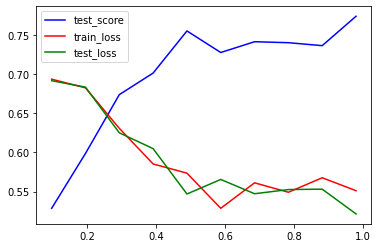

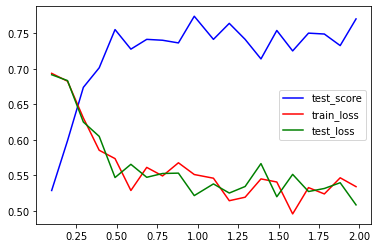

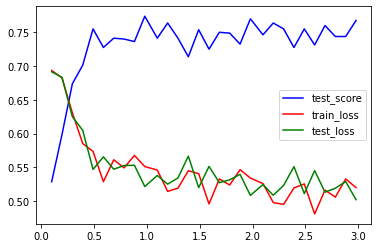

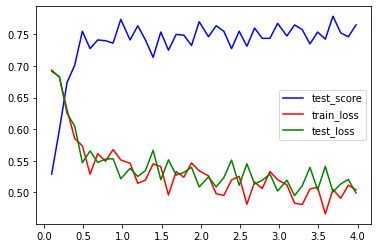

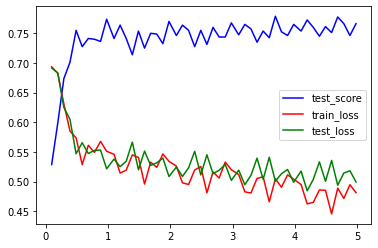

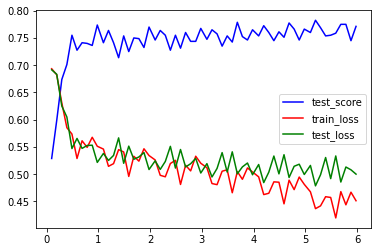

Finished Training


In [ ]:
net = Net()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

batch_size = 4

test_loss_array = []
loss_array = []

test_score_array = []
epoch_array_train = []
for epoch in range(6):  # loop over the dataset multiple times



  running_loss = 0.0
  running_test_loss = 0.0
  test_score = 0.0
  for i in range(0, len(train_list) - len(train_list)%batch_size, batch_size):
      # get the inputs; data is a list of [inputs, labels]
      indexes = train_list[i:i+batch_size]
      input_arr = np.array([img_list[ind] for ind in indexes])
      input_arr = np.transpose(input_arr, (0,3,1,2))
      inputs = FloatTensor(input_arr)
      label_arr = np.array([label_list[ind] for ind in indexes])
      labels = ByteTensor(label_arr)

      test_indexes = test_list[i%len(test_list):i%len(test_list)+batch_size]
      test_arr = np.array([img_list[ind] for ind in test_indexes])
      test_arr = np.transpose(test_arr, (0,3,1,2))
      test_tensor = FloatTensor(test_arr)
      test_label_arr = np.array([label_list[ind] for ind in test_indexes])
      test_labels = ByteTensor(test_label_arr)
      


      # zero the parameter gradients
      optimizer.zero_grad()

      # forward + backward + optimize
      outputs = net(inputs)
      loss = criterion(outputs, labels)
      loss.backward()
      optimizer.step()
      running_loss += loss.item()
      test_output = net(test_tensor)
      _, test_predicted = torch.max(test_output, 1)
      test_score += float(sum(test_predicted == test_labels)) / batch_size

      test_loss = criterion(test_output, test_labels)
      # print statistics
      running_test_loss += test_loss.item()
      
      if i/4 % 200 == 199:    # print every 200 mini-batches
          #print(f'[{epoch + 1},{i + 1:5d}] loss: {running_loss / 200:.3f}')
          test_loss_array += [running_test_loss / 200]
          test_score_array += [test_score/200]
          #print(running_test_loss/200)
          loss_array += [running_loss / 200]
          epoch_array_train += [epoch + float(i) / len(train_list)]
          test_score = 0.0
          running_loss = 0.0
          running_test_loss = 0.0
  
  plt.plot(epoch_array_train, test_score_array, c = 'b' , label = "test_score");
  plt.plot(epoch_array_train, loss_array, c = 'r', label = "train_loss");
  plt.plot(epoch_array_train, test_loss_array, c = 'g', label = "test_loss");
  plt.legend()
  plt.show()


print('Finished Training')


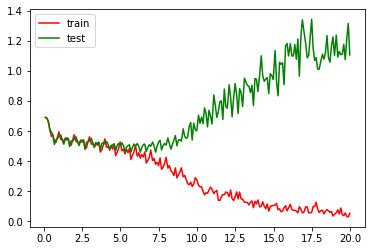

In [ ]:
plt.plot(epoch_array_train, loss_array, c = 'r', label = "train");
plt.plot(epoch_array_train, test_loss_array, c = 'g', label = "test");
plt.legend()
plt.show()

Наименьшая ошибка при валидации на 6 эпохах. Обучим на всей выборке на 6 эпохах.

In [ ]:
np.array(img_list[:4]).shape

(4, 100, 100, 3)

In [ ]:
net = Net()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

batch_size = 4

loss_array = []
epoch_array_train = []
for epoch in range(7):  # loop over the dataset multiple times



  running_loss = 0.0
  for i in range(0, len(img_list) - len(img_list)%batch_size, batch_size):

      # get the inputs; data is a list of [inputs, labels]
      full_list = train_list + test_list 
      indexes = full_list[i:i+batch_size]
      input_arr = np.array([img_list[ind] for ind in indexes])
      input_arr = np.transpose(input_arr, (0,3,1,2))
      inputs = FloatTensor(input_arr)
      label_arr = np.array([label_list[ind] for ind in indexes])
      labels = ByteTensor(label_arr)

      # zero the parameter gradients
      optimizer.zero_grad()

      # forward + backward + optimize
      outputs = net(inputs)
      loss = criterion(outputs, labels)
      loss.backward()
      optimizer.step()
      running_loss += loss.item()
      
      if i/4 % 200 == 199:    # print every 200 mini-batches
          print(f'[{epoch + 1},{i + 1:5d}] loss: {running_loss / 200:.3f}')
          loss_array += [running_loss / 200]
          epoch_array_train += [epoch + float(i) / len(img_list)]
          running_loss = 0.0
  
plt.plot(epoch_array_train, loss_array, c = 'r');
plt.title("training loss")
plt.show()


print('Finished Training')


[1,  797] loss: 0.694
[1, 1597] loss: 0.687
[1, 2397] loss: 0.677
[1, 3197] loss: 0.662
[1, 3997] loss: 0.633
[1, 4797] loss: 0.579
[1, 5597] loss: 0.603
[1, 6397] loss: 0.584
[1, 7197] loss: 0.599
[1, 7997] loss: 0.575
[1, 8797] loss: 0.555
[1, 9597] loss: 0.550
[1,10397] loss: 0.584
[1,11197] loss: 0.564
[2,  797] loss: 0.530
[2, 1597] loss: 0.516
[2, 2397] loss: 0.528
[2, 3197] loss: 0.553
[2, 3997] loss: 0.558
[2, 4797] loss: 0.519
[2, 5597] loss: 0.544
[2, 6397] loss: 0.539
[2, 7197] loss: 0.573
[2, 7997] loss: 0.545
[2, 8797] loss: 0.516
[2, 9597] loss: 0.508
[2,10397] loss: 0.541
[2,11197] loss: 0.528
[3,  797] loss: 0.502
[3, 1597] loss: 0.484
[3, 2397] loss: 0.502
[3, 3197] loss: 0.515
[3, 3997] loss: 0.534
[3, 4797] loss: 0.490
[3, 5597] loss: 0.509
[3, 6397] loss: 0.502
[3, 7197] loss: 0.549
[3, 7997] loss: 0.524
[3, 8797] loss: 0.486
[3, 9597] loss: 0.473
[3,10397] loss: 0.514
[3,11197] loss: 0.496
[4,  797] loss: 0.474
[4, 1597] loss: 0.466
[4, 2397] loss: 0.466
[4, 3197] 

KeyboardInterrupt: ignored

In [ ]:
PATH = '/content/drive/MyDrive/Colab Notebooks/cat_bread/cat_bread.pth'
torch.save(net.state_dict(), PATH)

In [ ]:
PATH = '/content/drive/MyDrive/Colab Notebooks/cat_bread/cat_bread.pth'

In [ ]:
import torch

In [ ]:
net1 = Net()
net1.load_state_dict(torch.load(PATH))
net1.eval()

Net(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=7744, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=2, bias=True)
)

In [ ]:
PATH = '/content/drive/MyDrive/Colab Notebooks/cat_bread/cat_bread.pth'
torch.save(net.state_dict(), PATH)

In [ ]:
test_list[0:4]

[3710, 10481, 10726, 1115]

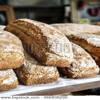

In [ ]:
random_array = (img_list[500] +0.5) * 255
random_array = random_array.astype(np.uint8)
img_temp = Image.fromarray(random_array)
display(img_temp)

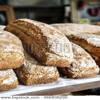

In [ ]:
img_temp

In [ ]:
test_list

In [ ]:
[num for num in test_list if label_list[num]]

In [ ]:
cat_list = []
for num,label in enumerate(label_list):
  if label:
    cat_list += [num]
print(len(cat_list))

5834


In [ ]:
cat_list = [num for num in test_list if label_list[num]]
len(cat_list)

1773

In [ ]:
cat_list_pred = []

In [ ]:
for num in cat_list:
  random_img = np.array([img_list[num]])
  random_img = np.transpose(random_img, (0,3,1,2))
  random_img = FloatTensor(random_img)
  outputs = net1(random_img)
  import torch
  _, predicted = torch.max(outputs, 1)
  for pred in predicted:
    cat_list_pred += [int(pred)]

In [ ]:
sum(cat_list_pred) / len(cat_list_pred)

0.7856739988719684

In [ ]:
bread_list = []
for num,label in enumerate(label_list):
  if not label:
    bread_list += [num]
print(len(bread_list))

5836


In [ ]:
bread_list_pred = []
bread_list = [num for num in test_list if not label_list[num]]
for num in bread_list:
  random_img = np.array([img_list[num]])
  random_img = np.transpose(random_img, (0,3,1,2))
  random_img = FloatTensor(random_img)
  outputs = net1(random_img)
  import torch
  _, predicted = torch.max(outputs, 1)
  for pred in predicted:
    bread_list_pred += [int(pred)]
  

In [ ]:
1 - sum(bread_list_pred) / len(bread_list_pred)

0.8299595141700404

In [ ]:
sum(bread_list_pred)

5836

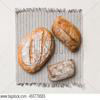

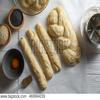

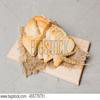

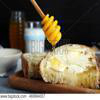

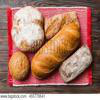

tensor([0, 0, 0, 0, 0])
1.0
bread
bread
bread
bread
bread


In [ ]:
list_1 = bread_list[0:5]
for num in list_1:
  random_array = (img_list[num] +0.5) * 255
  random_array = random_array.astype(np.uint8)
  img_temp = Image.fromarray(random_array)
  display(img_temp)

random_img = np.array([img_list[num] for num in list_1])
random_img = np.transpose(random_img, (0,3,1,2))
random_img = FloatTensor(random_img)
outputs = net1(random_img)
import torch
_, predicted = torch.max(outputs, 1)

print(predicted)
arr_temp = np.array([label_list[num] for num in list_1])
print(float(sum(predicted == FloatTensor(arr_temp))/predicted.shape[0]))
for pred in predicted:
  print(classes[int(pred)])

#print(predicted)

In [ ]:
import torch

In [ ]:
def read_input():
  input_path = '/content/drive/MyDrive/Colab Notebooks/cat_bread/input/'
  input_files = []
  input_fail = []
  for file in os.listdir(input_path):
    try:
        img = Image.open(input_path + file)
        if img.mode != 'RGB':
          img = img.convert('RGB')
        input_files += [img]
    except:
        input_fail += [f'{file_name}']
  if input_fail != []:
    print("input fails:", input_fail)
  return input_files

In [ ]:
def img_2_array(img_list):
  img_list
  img_array = img_list.copy()

  for num, img in enumerate(img_list):
  #img_list[num]  = np.array(img.resize((max_width, max_height)))
    img_array[num]  = np.array(img.resize((100, 100)))
    img_array[num] = img_array[num] / 255.0 - 0.5
  img_array = np.array(img_array)
  img_array = np.transpose(img_array, (0,3,1,2))
  return img_array

In [ ]:
def predict_inputs():
  input_files = read_input()
  input_arr = img_2_array(input_files)
  input_tensor = FloatTensor(input_arr)
  outputs = net(input_tensor)
  _, predicted = torch.max(outputs, 1)
  for num, file in enumerate(input_files):
    display(file)
    print(outputs[num])
    print(f'Predicted class: {classes[int(predicted[num])]}')

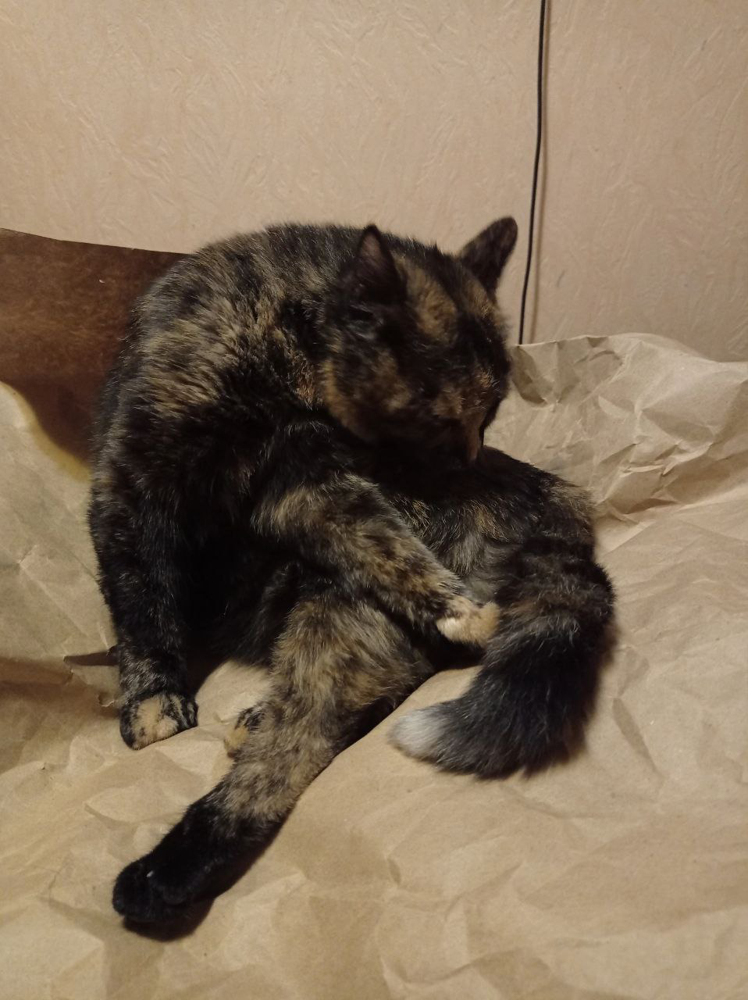

tensor([-1.1421,  1.1620], grad_fn=<SelectBackward0>)
Predicted class: cat


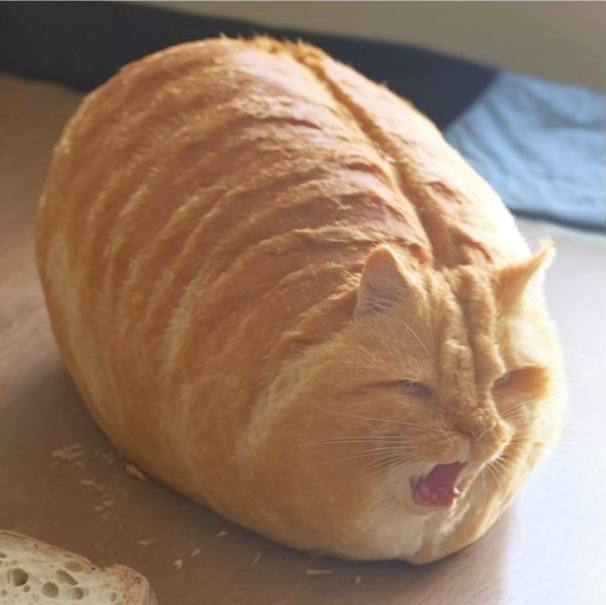

tensor([ 1.3353, -1.2649], grad_fn=<SelectBackward0>)
Predicted class: bread


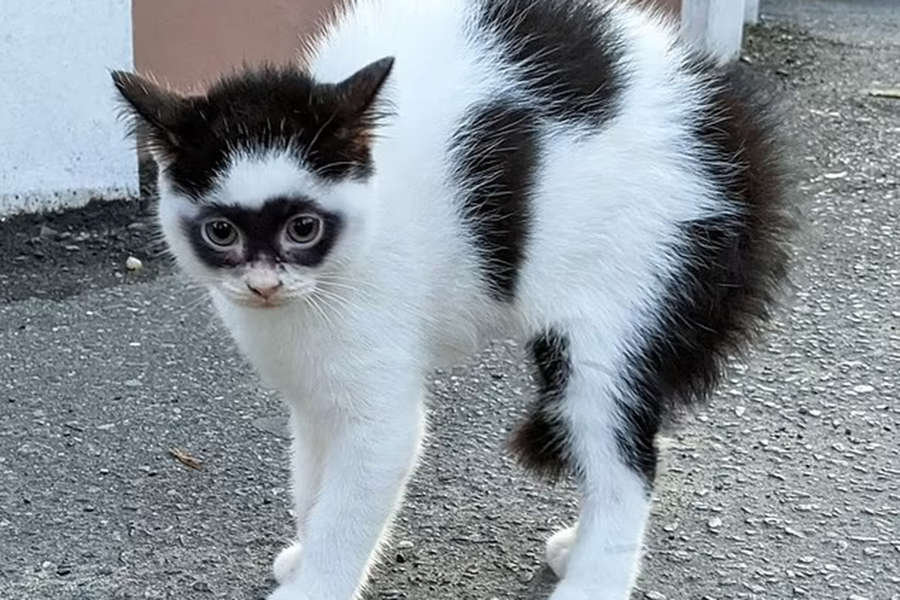

tensor([-1.4891,  1.5357], grad_fn=<SelectBackward0>)
Predicted class: cat


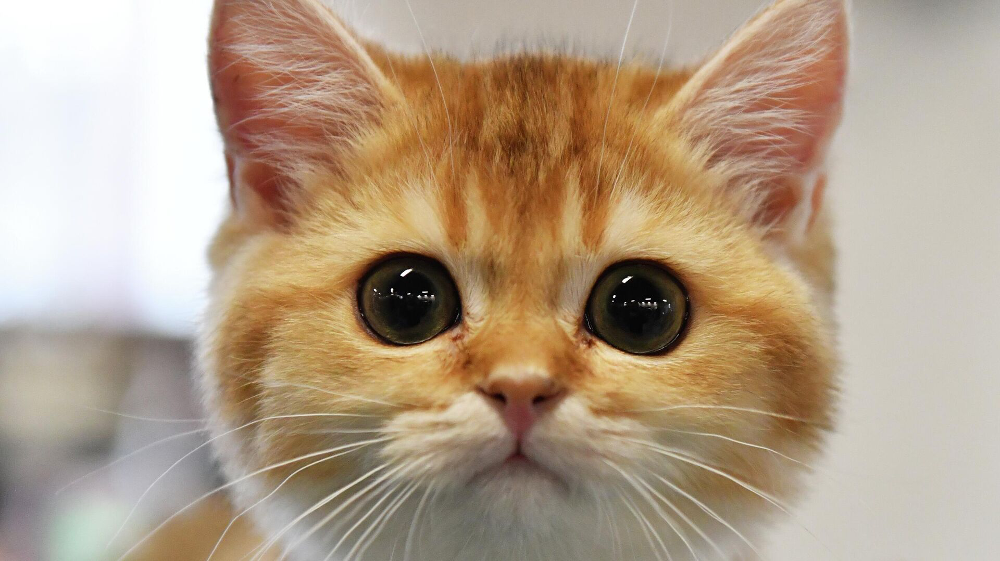

tensor([ 1.0980, -1.0811], grad_fn=<SelectBackward0>)
Predicted class: bread


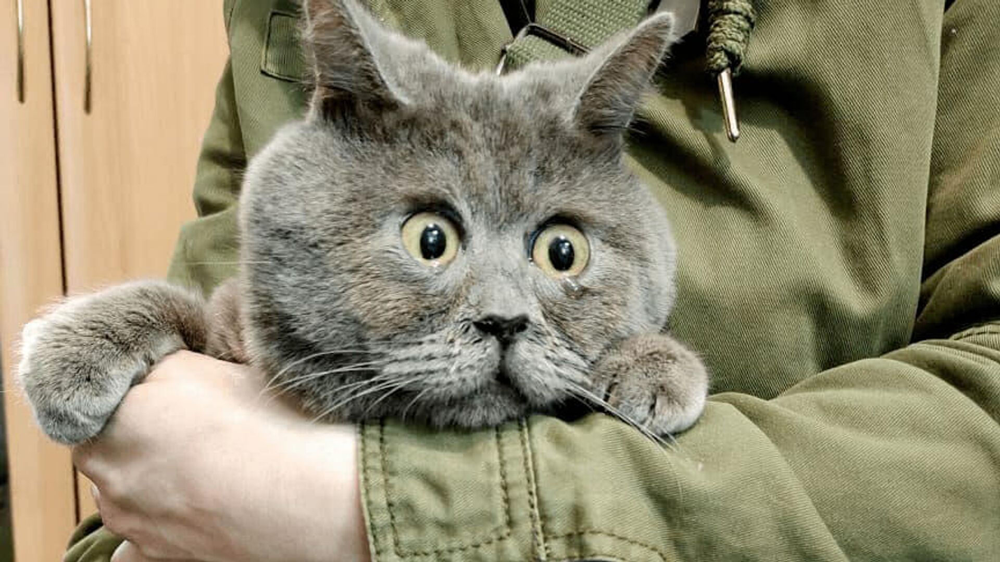

tensor([-0.8424,  0.8399], grad_fn=<SelectBackward0>)
Predicted class: cat


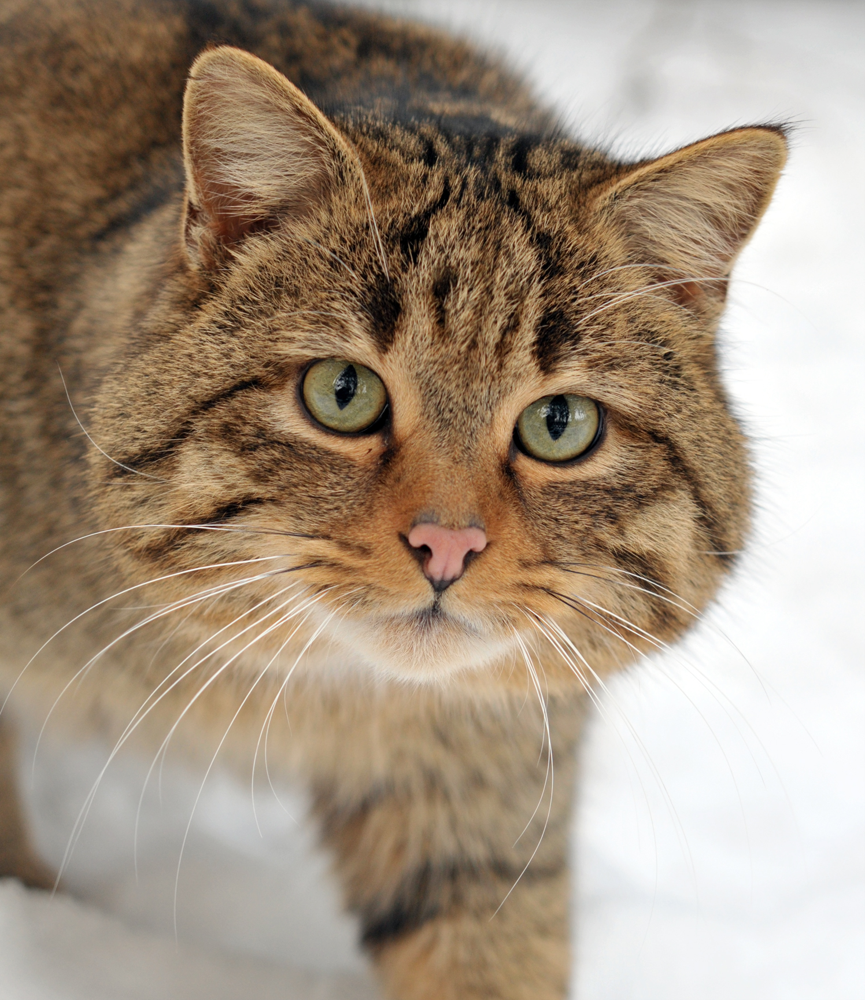

tensor([ 1.6033, -1.4945], grad_fn=<SelectBackward0>)
Predicted class: bread


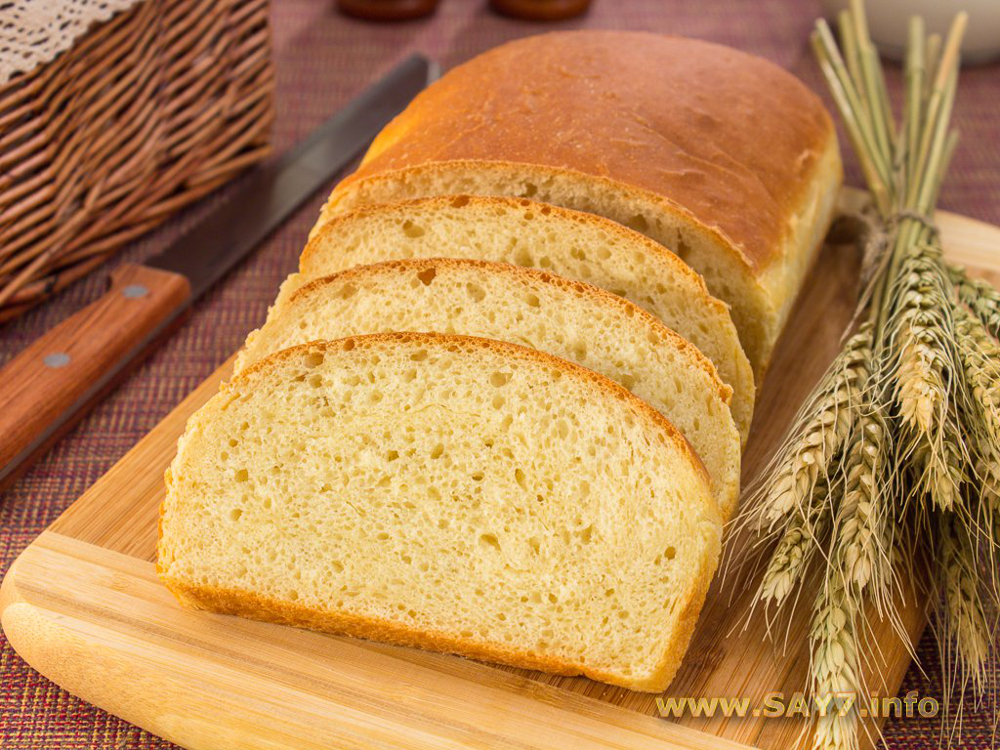

tensor([ 1.2607, -1.2845], grad_fn=<SelectBackward0>)
Predicted class: bread


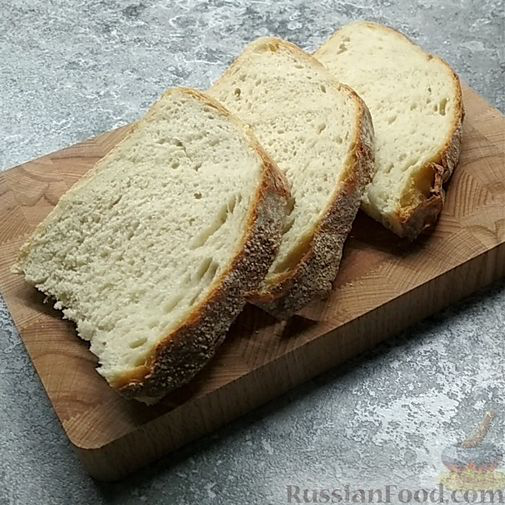

tensor([ 0.9407, -0.9567], grad_fn=<SelectBackward0>)
Predicted class: bread


In [ ]:
predict_inputs()

Info  0


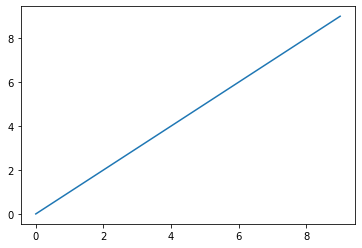

Info  1


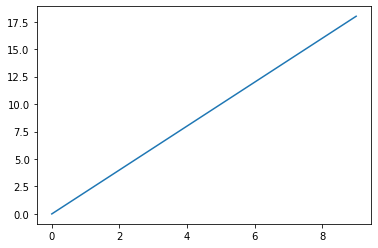

Info  2


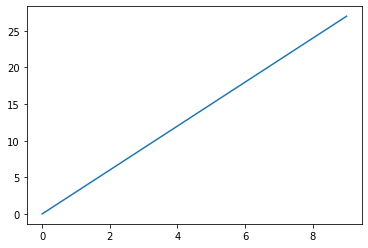

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display

for i in range(3):
    print("Info ",i)
    fig, ax = plt.subplots()
    ax.plot(np.arange(10)*(i+1))
    display(fig)
    plt.close()